# ECS7020P mini-project submission

The mini-project has two separate components:


1.   **Basic component** [6 marks]: Using the MLEnd London Sounds dataset, build a machine learning pipeline that takes as an input an audio segment and predicts whether the audio segment has been recorded indoors or outdoors.
2.   **Advanced component** [10 marks]: Formulate your own machine learning problem and build a machine learning solution using the MLEnd London Sounds dataset. 

Your submission will consist of two Jupyter notebooks, one for the basic component and another one for advanced component. Please **name each notebook**:

* ECS7020P_miniproject_basic.ipynb
* ECS7020P_miniproject_advanced.ipynb

then **zip and submit them toghether**.

Each uploaded notebook should include: 

*   **Text cells**, describing concisely each step and results.
*   **Code cells**, implementing each step.
*   **Output cells**, i.e. the output from each code cell.

and **should have the structure** indicated below. Notebooks might not be run, please make sure that the output cells are saved.

How will we evaluate your submission?

*   Conciseness in your writing (10%).
*   Correctness in your methodology (30%).
*   Correctness in your analysis and conclusions (30%).
*   Completeness (10%).
*   Originality (10%).
*   Efforts to try something new (10%).

Suggestion: Why don't you use **GitHub** to manage your project? GitHub can be used as a presentation card that showcases what you have done and gives evidence of your data science skills, knowledge and experience. 

Each notebook should be structured into the following 9 sections:


# 1. Author

**Student Name**:  Riya Dodthi </br>
**Student ID**:  220266251



# 2. Problem formulation

*Describe the machine learning problem that you want to solve and explain what's interesting about it.*


In this project, I will build a trained machine learning model to predict whether the input sample sound is recorded in which of the following areas-. In the provided MLEnd London Sounds dataset, we have a mixture of sounds recorded both indoors and outdoors. Identifying where the given input audio segment is recorded, can have multiple applications for e.g., a device which requires to know it's environment in order to provide accurate results.

# 3. Machine Learning pipeline

Describe your ML pipeline. Clearly identify its input and output, any intermediate stages (for instance, transformation -> models), and intermediate data moving from one stage to the next. It's up to you to decide which stages to include in your pipeline. 


The ML pipeline in this project includes:
1. ***Data Transformation*** - </br>
In this stage, we are taking raw audio files as input and returning output of features and label where **features** are the **Power, Pitch - mean, Pitch - standard deviation, Fraction of voiced region** of an audio samples and **label** is the description whether the audio sound is **indoors or outdoors**. </br>
While performing feature extraction we are also performing **data cleaning** by excluding the audio files which can be broken or problematic and interrupt the process of feature extraction. This is achieved using a **try-except** block where 'except' block displays the problematic file, skips it and continues with the rest of the dataset.</br></br>

2. ***SVM Model*** - </br>
The ML problem in this project is a classificatin problem, hence we will be using supervised ML model approach. SVM model uses supervised algorithm for binary classification. </br>
We will first split the dataset of extracted features and labels (from stage 1 of pipeline) into training and validation dataset. The SVM models uses training dataset to train the model, then use the features of validation dataset to predict the labels of the audio inputs of validation dataset.

**Pipeline:**

Raw data --> | Transformation (Data cleaning and Feature extraction) |--> Extracted features --> | Modeling | --> predicted labels



# 4 Transformation stage

Describe any transformations, such as feature extraction. Identify input and output. Explain why you have chosen this transformation stage.

**Data Cleaning:**</br>
For performing feature extraction we also need to perform **data cleaning** by excluding the audio files which can be broken or problematic and can interrupt the process of feature extraction. This is achieved using a **try-except** block where 'except' block displays the problematic file, skips it and continues with the rest of the dataset.</br></br>

**Feature Extraction:**</br>
In this stage, we are taking raw audio files as input and returning output of features and label where **features** are the **Power, Pitch - mean, Pitch - standard deviation, Fraction of voiced region** of an audio samples and **label** is the description whether the audio sound is **indoors or outdoors**. If we are using a raw audio signal as the input of a machine learning model, we will be operating in a predictor space consisting of hundreds of thousands of dimensions. We do not have the resourses to handle such dimentionality. Hence we are using the few specified features of the audio file and input features.</br>

# 5 Modelling

Describe the ML model(s) that you will build. Explain why you have chosen them.

 ***SVM Model*** - </br>
The ML problem in this project is a classificatin problem, hence we will be using supervised ML model approach. SVM model uses supervised algorithm for binary classification. </br>
We will first split the dataset of extracted features and labels (from stage 1 of pipeline) into training and validation dataset. The SVM models uses training dataset to train the model, then use the features of validation dataset to predict the labels of the audio inputs of validation dataset.


# 6 Methodology

Describe how you will train and validate your models, how model performance is assesssed (i.e. accuracy, confusion matrix, etc)

The SVM model first uses training dataset to train the model. The training dataset is the combination of features and labels. The classifier obtained after training the model is then used to make prediction on the validation dataset where the classifier takes the features from validation dataset as input and returns the predicted labels.

***Model Evaluation:***</br>
**Accuracy**: The performance of the model can be evaluated by computing the accuracy percentage. The accuracy is calculated using mean of all accurate predictions.

**Confusion matrix**: Confusion matrix can be used to analyse the number of fale positive and false negatives for each class i.e.,which class is being falsely predicted and by how much. This evaluation method can help improve the precision and recall score of the model.

# 7 Dataset

Describe the dataset that you will use to create your models and validate them. If you need to preprocess it, do it here. Include visualisations too. You can visualise raw data samples or extracted features.

In [1]:
pip install pydub

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [53]:
from google.colab import drive

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import os, sys, re, pickle, glob
import urllib.request
import zipfile

import IPython.display as ipd
from tqdm import tqdm
import librosa
from pydub import AudioSegment

drive.mount('/content/drive',force_remount=True)

Mounted at /content/drive


In [12]:
basic_path = '/content/drive/MyDrive/Data/MLEndLS/basic/MLEndLS/*.wav'
files = glob.glob(basic_path)
for i in range(len(files[0:100])):
  print(i,"\t",files[i])

0 	 /content/drive/MyDrive/Data/MLEndLS/basic/MLEndLS/1500.wav
1 	 /content/drive/MyDrive/Data/MLEndLS/basic/MLEndLS/1501.wav
2 	 /content/drive/MyDrive/Data/MLEndLS/basic/MLEndLS/1502.wav
3 	 /content/drive/MyDrive/Data/MLEndLS/basic/MLEndLS/1503.wav
4 	 /content/drive/MyDrive/Data/MLEndLS/basic/MLEndLS/1504.wav
5 	 /content/drive/MyDrive/Data/MLEndLS/basic/MLEndLS/1505.wav
6 	 /content/drive/MyDrive/Data/MLEndLS/basic/MLEndLS/1506.wav
7 	 /content/drive/MyDrive/Data/MLEndLS/basic/MLEndLS/1507.wav
8 	 /content/drive/MyDrive/Data/MLEndLS/basic/MLEndLS/1508.wav
9 	 /content/drive/MyDrive/Data/MLEndLS/basic/MLEndLS/1509.wav
10 	 /content/drive/MyDrive/Data/MLEndLS/basic/MLEndLS/1510.wav
11 	 /content/drive/MyDrive/Data/MLEndLS/basic/MLEndLS/1511.wav
12 	 /content/drive/MyDrive/Data/MLEndLS/basic/MLEndLS/1512.wav
13 	 /content/drive/MyDrive/Data/MLEndLS/basic/MLEndLS/1513.wav
14 	 /content/drive/MyDrive/Data/MLEndLS/basic/MLEndLS/1514.wav
15 	 /content/drive/MyDrive/Data/MLEndLS/basic/MLE

In [35]:
from scipy.io import wavfile
 
def trim_wav( originalWavPath, newWavPath , start, end ):
    '''
    :param originalWavPath: the path to the source wav file
    :param newWavPath: output wav file * can be same path as original
    :param start: time in seconds
    :param end: time in seconds
    :return:
    '''
    sampleRate, waveData = wavfile.read( originalWavPath )
    print(sampleRate)
    startSample = int( start * sampleRate )
    print(startSample)
    endSample = int( end * sampleRate )
    print(endSample)
    wavfile.write( newWavPath, sampleRate, waveData[startSample:endSample])
 
display(ipd.Audio(files[0])) 
wp = files[0]
trim_wav(wp, wp.replace(".wav", ".wav"), 0,8)

display(ipd.Audio(files[0]))
print(wp.replace(".wav", ".wav")) 


44100
0
352800


/content/drive/MyDrive/Data/MLEndLS/basic/MLEndLS/1500.wav


In [54]:
basic_path = '/content/drive/MyDrive/Data/MLEndLS/basic/MLEndLS/*.wav'
files = glob.glob(basic_path)
print(files[0],"\n",files[1])
display(ipd.Audio(files[0]))

/content/drive/MyDrive/Data/MLEndLS/basic/MLEndLS/1500.wav 
 /content/drive/MyDrive/Data/MLEndLS/basic/MLEndLS/1501.wav


In [55]:
from pydub import AudioSegment
from pydub.playback import play



# Import part 1 and part 2 audio files
part_1 = AudioSegment.from_file(files[0])


# Remove the first four seconds of part 1
part_1_removed = part_1[2000:]

#
part_1_removed.export(out_f = "/content/drive/MyDrive/Data/MLEndLS/basic/MLEndLS/1500.wav",
                       format = "wav")


display(ipd.Audio(files[0]))

In [13]:
#for _ in range(5):
  #n = np.random.randint(98)
print("Campus")
display(ipd.Audio(files[0]))
print("Southbank")
display(ipd.Audio(files[1]))
print("Euston")
display(ipd.Audio(files[2]))
print("British")
display(ipd.Audio(files[27]))
print("Westend")
display(ipd.Audio(files[59]))
print("Kingston")
display(ipd.Audio(files[34]))

Campus


Southbank


Euston


British


Westend


Kingston


In [ ]:
basic_path = '/content/drive/MyDrive/Data/MLEndLS/basic/MLEndLS/*.wav'
files = glob.glob(basic_path)
#for i in range(len(files[0:100])):
  #print(i,"\t",files[i])

In [3]:

def download_url(url, save_path):
    with urllib.request.urlopen(url) as dl_file:
        with open(save_path, 'wb') as out_file:
            out_file.write(dl_file.read())

'''
url  = "https://github.com/riyadodthi/MLEndLS/raw/main/MLEndLS.zip"
save_path = '/content/drive/MyDrive/Data/MLEndLS/MLEndLS.zip'
download_url(url, save_path)
'''
#---------------------------------------------------

'''
directory_to_extract_to = '/content/drive/MyDrive/Data/MLEndLS/basic/'
zip_path = '/content/drive/MyDrive/Data/MLEndLS/MLEndLS.zip'
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(directory_to_extract_to)

'''
#--------------------------------------------------------
# Check len of dataset

basic_path = '/content/drive/MyDrive/Data/MLEndLS/basic/MLEndLS/*.wav'
files = glob.glob(basic_path)
print("Lenght of dataset: ",len(files))

#-----------Upload CSV file------------------------------
MLENDLS_df = pd.read_csv('./MLEndLS.csv').set_index('file_id') 
display(MLENDLS_df.head())


# ----------spot--------------------
spot=[]
number=[]
df = MLENDLS_df['spot']
for n in df:
  spot.append(n)

for i in range(0,32):
  number.append(i)

spot = set(spot)
spot_list = list(spot)
df.replace(spot_list,number, inplace=True)
MLENDLS_df['spot'] = df
#display(MLENDLS_df)
# -----------------Area----------------
area=[]
number1=[]
df1 = MLENDLS_df['area']
for n in df1:
  area.append(n)


for i in range(0,6):
  number1.append(i)

area = set(area)
area_list = list(area)

df1.replace(area_list,number1, inplace=True)
MLENDLS_df['area'] = df1
display(MLENDLS_df)
#-----------Feature Extraction and Data cleaning ---------


def getPitch(x,fs,winLen=0.02):
  #winLen = 0.02 
  p = winLen*fs
  frame_length = int(2**int(p-1).bit_length())
  hop_length = frame_length//2
  f0, voiced_flag, voiced_probs = librosa.pyin(y=x, fmin=80, fmax=450, sr=fs,
                                                 frame_length=frame_length,hop_length=hop_length)
  return f0,voiced_flag

def getXy(files,labels_file, scale_audio=False, onlySingleDigit=False):
  X,y =[],[]
  for file in tqdm(files):
    try:
      fileID = file.split('/')[-1]
      file_name = file.split('/')[-1]
      yi = labels_file.loc[fileID]['area']
      spot = labels_file.loc[fileID]['spot']

      fs = None # if None, fs would be 22050
      x, fs = librosa.load(file,sr=fs)
      if scale_audio: x = x/np.max(np.abs(x))
      f0, voiced_flag = getPitch(x,fs,winLen=0.02)
        
      power = np.sum(x**2)/len(x)
      pitch_mean = np.nanmean(f0) if np.mean(np.isnan(f0))<1 else 0
      pitch_std  = np.nanstd(f0) if np.mean(np.isnan(f0))<1 else 0
      voiced_fr = np.mean(voiced_flag)

      xi = [power,pitch_mean,pitch_std,voiced_fr]
      X.append(xi)
      y.append(yi)
      #print(spot)
      #print(xi)
    except:
      print("\n",file)
      continue

  return np.array(X),np.array(y)


X,y = getXy(files[0:100], labels_file=MLENDLS_df, scale_audio=True, onlySingleDigit=True)
#print(X,y)


Lenght of dataset:  2500


,area,spot,in_out,Participant
file_id,,,,
0001.wav,british,street,outdoor,S151
0002.wav,kensington,dinosaur,indoor,S127
0003.wav,campus,square,outdoor,S18
0004.wav,kensington,hintze,indoor,S179
0005.wav,campus,square,outdoor,S176


,area,spot,in_out,Participant
file_id,,,,
0001.wav,4,9,outdoor,S151
0002.wav,1,28,indoor,S127
0003.wav,5,26,outdoor,S18
0004.wav,1,30,indoor,S179
0005.wav,5,26,outdoor,S176
...,...,...,...,...
2496.wav,3,13,outdoor,S151
2497.wav,5,26,outdoor,S6
2498.wav,3,10,indoor,S96


100%|██████████| 100/100 [06:37<00:00,  3.97s/it]


In [17]:
X_2,y_2 = getXy(files[0:500], labels_file=MLENDLS_df, scale_audio=True, onlySingleDigit=True)

100%|██████████| 500/500 [13:54<00:00,  1.67s/it]


In [18]:
X_3,y_3 = getXy(files[0:1000], labels_file=MLENDLS_df, scale_audio=True, onlySingleDigit=True)

 70%|███████   | 705/1000 [18:16<08:03,  1.64s/it]/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:87: RuntimeWarning: invalid value encountered in true_divide



 /content/drive/MyDrive/Data/MLEndLS/basic/MLEndLS/2206.wav


100%|██████████| 1000/1000 [26:13<00:00,  1.57s/it]


In [4]:
X_3,y_3 = getXy(files, labels_file=MLENDLS_df, scale_audio=True, onlySingleDigit=True)

 28%|██▊       | 705/2500 [16:24<45:52,  1.53s/it]/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:87: RuntimeWarning: invalid value encountered in true_divide



 /content/drive/MyDrive/Data/MLEndLS/basic/MLEndLS/2206.wav


 81%|████████  | 2022/2500 [47:12<10:56,  1.37s/it]


 /content/drive/MyDrive/Data/MLEndLS/basic/MLEndLS/0033.wav


100%|██████████| 2500/2500 [58:50<00:00,  1.41s/it]


# 8 Results

Carry out your experiments here, explain your results.

In [76]:
#---- Split dataset-----------------------------------------------
from sklearn import svm
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier

from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_recall_fscore_support

X_train, X_val, y_train, y_val = train_test_split(X_3,y_3,test_size=0.3, random_state=4)
print(X_train.shape, X_val.shape, y_train.shape, y_val.shape)
#print(X_train[0:5],y_train[0:5])
#------Modeling--------------------------------------------------
#model  = svm.SVC(C=1)
#model = LogisticRegression(random_state=0)
#model = KNeighborsClassifier(n_neighbors=20)
model = DecisionTreeClassifier(random_state=0,class_weight='balanced')

model.fit(X_train,y_train)


yt_p = model.predict(X_train)
yv_p = model.predict(X_val)

#--------Evaluation------------------------------------------------
print("\nBefore normalising:\n")
print('Training Accuracy', np.mean(yt_p==y_train))
print('Validation  Accuracy', np.mean(yv_p==y_val))
print()

#print(precision_recall_fscore_support(y_train,yt_p, average='weighted'))
#print(precision_recall_fscore_support(y_val,yv_p, average='weighted'))
#print('The support vectors are', model.support_vectors_.shape)
print()

#------------Normalise------------
mean = X_train.mean(0)
sd =  X_train.std(0)

X_train = (X_train-mean)/sd
X_val  = (X_val-mean)/sd

#model  = svm.SVC(C=1,gamma=2)
model = DecisionTreeClassifier(random_state=0,class_weight='balanced')
model.fit(X_train,y_train)

yt_p = model.predict(X_train)
yv_p = model.predict(X_val)
print("\nAfter normalising:\n")
print('Training Accuracy', np.mean(yt_p==y_train))
print('Validation  Accuracy', np.mean(yv_p==y_val))
print()

#print('The support vectors are', model.support_vectors_.shape)

#print(len(y_train))
print("Confusion matrix of training:")
confusion_matrix(y_train, yt_p, labels=[0,1,2,3,4,5])
#confusion_matrix(y_val, yv_p, labels=[0,1,2,3,4,5])


(1748, 4) (750, 4) (1748,) (750,)

Before normalising:

Training Accuracy 1.0
Validation  Accuracy 0.244



After normalising:

Training Accuracy 1.0
Validation  Accuracy 0.244

Confusion matrix of training:


array([[162,   0,   0,   0,   0,   0],
       [  0,  95,   0,   0,   0,   0],
       [  0,   0, 144,   0,   0,   0],
       [  0,   0,   0, 477,   0,   0],
       [  0,   0,   0,   0, 293,   0],
       [  0,   0,   0,   0,   0, 577]])

Experiment 2: Balance the classes

In [49]:
import warnings
warnings.filterwarnings('ignore')

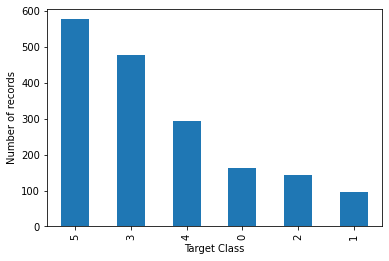

In [58]:
import matplotlib.pyplot as plt
X_train, X_val, y_train, y_val = train_test_split(X_3,y_3,test_size=0.3, random_state=4)
idx=pd.Index(y_train)
count = idx.value_counts()


count.plot.bar()
plt.ylabel('Number of records')
plt.xlabel('Target Class')
plt.show()

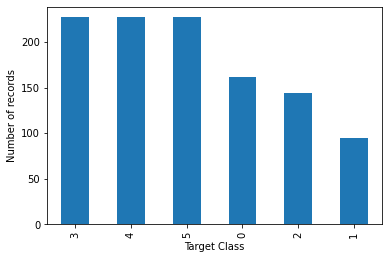

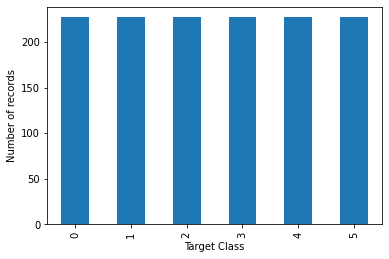

In [60]:


idx=pd.Index(y_train)
count = idx.value_counts()
n_samples = count.median().astype(np.int64)

def sampling_strategy(X,y,n_samples, t='majority'):
    idx=pd.Index(y)
    target_classes = ''
    if t == 'majority':
        target_classes = idx.value_counts() > n_samples
    elif t == 'minority':
        target_classes = idx.value_counts() < n_samples
    tc = target_classes[target_classes == True].index
    #target_classes_all = y.value_counts().index
    sampling_strategy = {}
    for target in tc:
        sampling_strategy[target] = n_samples
    return sampling_strategy


from imblearn.under_sampling import ClusterCentroids
under_sampler = ClusterCentroids(sampling_strategy=sampling_strategy(X_train,y_train,n_samples,t='majority'))
X_under, y_under = under_sampler.fit_resample(X_train, y_train)

idx=pd.Index(y_under)
count = idx.value_counts()
count.plot.bar()
plt.ylabel('Number of records')
plt.xlabel('Target Class')
plt.show()

from imblearn.over_sampling import SMOTE
over_sampler = SMOTE(sampling_strategy=sampling_strategy(X_under, y_under,n_samples, t='minority'),k_neighbors=2)
X_bal, y_bal = over_sampler.fit_resample(X_under, y_under)

idx=pd.Index(y_bal)
count = idx.value_counts()
count.plot.bar()
plt.ylabel('Number of records')
plt.xlabel('Target Class')
plt.show()

In [62]:
print(len(X_train), len(y_train))
print(len(X_bal), len(y_bal))

1748 1748
1362 1362


In [79]:
#---- Split dataset-----------------------------------------------
from sklearn import svm
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier

from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_recall_fscore_support

X_train, X_val, y_train, y_val = train_test_split(X_3,y_3,test_size=0.3, random_state=4)
print(X_train.shape, X_val.shape, y_train.shape, y_val.shape)
#print(X_train[0:5],y_train[0:5])

#--------Balance classes-------------------------------------
idx=pd.Index(y_train)
count = idx.value_counts()
n_samples = count.median().astype(np.int64)

def sampling_strategy(X,y,n_samples, t='majority'):
    idx=pd.Index(y)
    target_classes = ''
    if t == 'majority':
        target_classes = idx.value_counts() > n_samples
    elif t == 'minority':
        target_classes = idx.value_counts() < n_samples
    tc = target_classes[target_classes == True].index
    #target_classes_all = y.value_counts().index
    sampling_strategy = {}
    for target in tc:
        sampling_strategy[target] = n_samples
    return sampling_strategy


from imblearn.under_sampling import ClusterCentroids
under_sampler = ClusterCentroids(sampling_strategy=sampling_strategy(X_train,y_train,n_samples,t='majority'))
X_under, y_under = under_sampler.fit_resample(X_train, y_train)


from imblearn.over_sampling import SMOTE
over_sampler = SMOTE(sampling_strategy=sampling_strategy(X_under, y_under,n_samples, t='minority'),k_neighbors=2)
X_bal, y_bal = over_sampler.fit_resample(X_under, y_under)
#------Modeling--------------------------------------------------
#model  = svm.SVC(C=1)
#model = LogisticRegression(random_state=0)
model = KNeighborsClassifier(n_neighbors=10)
#model = DecisionTreeClassifier(random_state=0)

model.fit(X_bal,y_bal)


yt_p = model.predict(X_bal)
yv_p = model.predict(X_val)

#--------Evaluation------------------------------------------------
print("\nBefore normalising:\n")
print('Training Accuracy', np.mean(yt_p==y_bal))
print('Validation  Accuracy', np.mean(yv_p==y_val))
print()



#------------Normalise------------

mean = X_bal.mean(0)
sd =  X_bal.std(0)

X_bal = (X_bal-mean)/sd
X_val  = (X_val-mean)/sd

#model  = svm.SVC(C=1,gamma=2)
#model = DecisionTreeClassifier(random_state=0)
#model = KNeighborsClassifier(n_neighbors=6)
model.fit(X_bal,y_bal)

yt_p = model.predict(X_bal)
yv_p = model.predict(X_val)
print("\nAfter normalising:\n")
print('Training Accuracy', np.mean(yt_p==y_bal))
print('Validation  Accuracy', np.mean(yv_p==y_val))
print()
print(precision_recall_fscore_support(y_bal,yt_p, average='weighted'))
print(precision_recall_fscore_support(y_val,yv_p, average='weighted'))

#print(len(y_train))
print("Confusion matrix of training:")
confusion_matrix(y_val, yv_p, labels=[0,1,2,3,4,5])



(1748, 4) (750, 4) (1748,) (750,)

Before normalising:

Training Accuracy 0.45080763582966227
Validation  Accuracy 0.17066666666666666


After normalising:

Training Accuracy 0.47063142437591776
Validation  Accuracy 0.224

(0.46220717900526775, 0.47063142437591776, 0.4577061584390959, None)
(0.325305897691904, 0.224, 0.23177526434368748, None)
Confusion matrix of training:


array([[26, 18, 15,  3,  5,  5],
       [ 8, 14, 11,  9,  3,  3],
       [18, 18, 26,  6, 11,  6],
       [28, 40, 34, 48, 21, 18],
       [32, 18, 19, 11, 24,  7],
       [39, 57, 49, 38, 32, 30]])

The model is first tested using the validation dataset where the features from val dataset is taken as input by the classifier and return its correspoding predictions.

The accuracy of the model is calculated using mean of all accurate predictions.
To check whether our model is overfitting, underfitting or performing well, we calculate the accuracies of classifier on both training and validation dataset.</br>

It can be observed that the difference between the training and validation accuracies considerably low. The model is just slightly overfitting.</br>

Experiment 1: Normalisation of feature values. </br>
Whereas after normalising the featureset for both the dataset, the difference between the training and val accuracies was very high. the model performed well on training set but poorly on validation. Hence normalisation caused the model to overfit.</br>

Experiment 2: SVM Parameter: class-weight</br>
Class weight parameter can be used in unbalanced dataset. Higher class-weight means you want to put more emphasis on a class. Since in our dataset the difference between the class weight is just about 5% the class-weight paraeter does not affect the performance much.




# 9 Conclusions

Your conclusions, improvements, etc should go here

In conclusion, we tried to predict whether the input audio file is recorded indoor or outdoors using SVM model with features as Power, Pitch - mean, Pitch - standard deviation, Fraction of voiced region and corresponding labels- indoor/outdoor from the csv file.  

100 samples (small dataset):
The model gave approx. 66% accuracy on the training data and 43% on validation data which is underfitting.

500 samples (medium samples):The model gave approx. 55% accuracy on the training data and 51% on validation data which is underfitting.

1000 samples (large dataset): 53% train and val 48%

2500 samples (very large dataset):


The model performance improved with larger datasets.